<a href="https://colab.research.google.com/github/VedikaSawant/vehicle-detection-bad-weather-cv/blob/main/CV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

total frames: 636


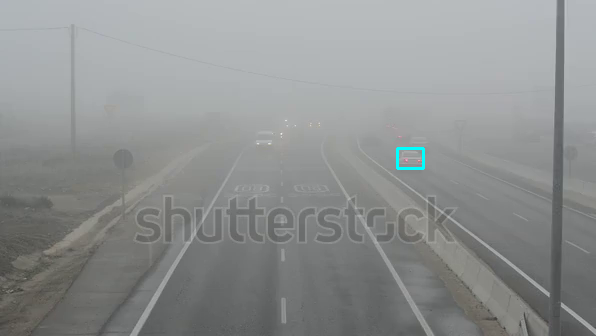

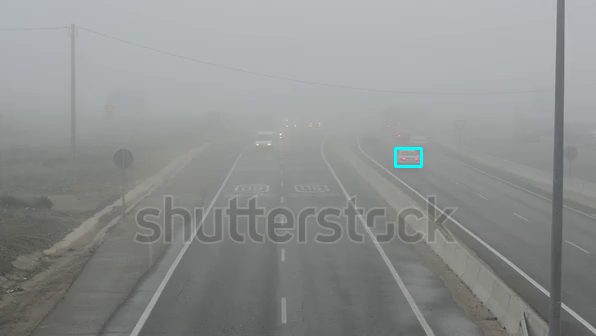

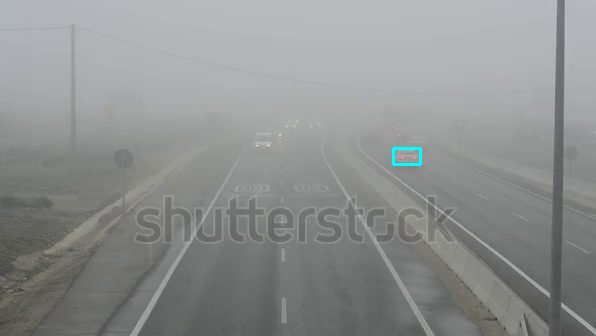

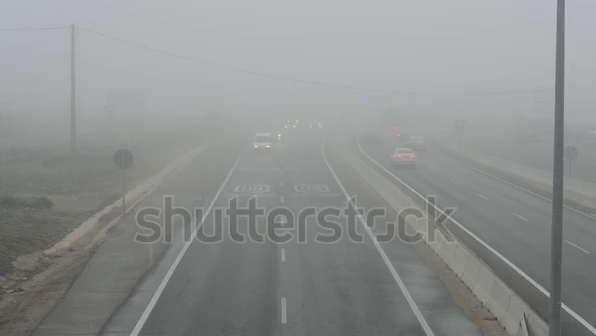

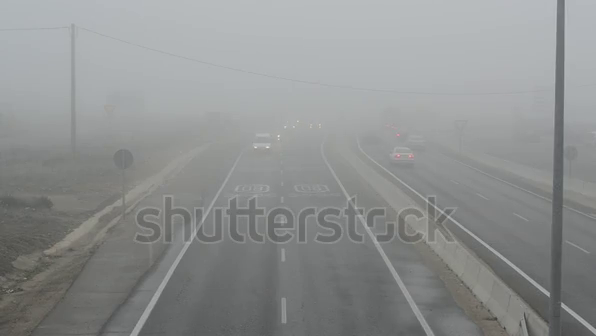

...

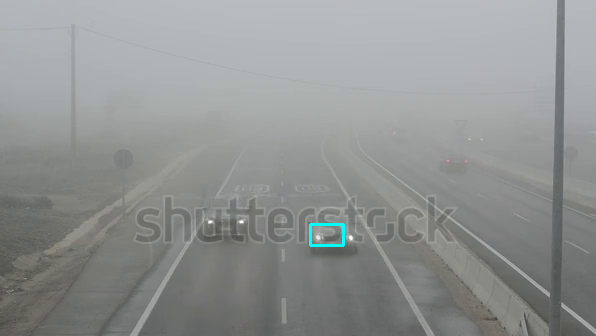

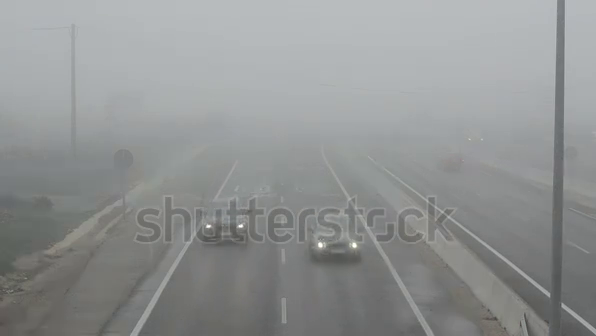

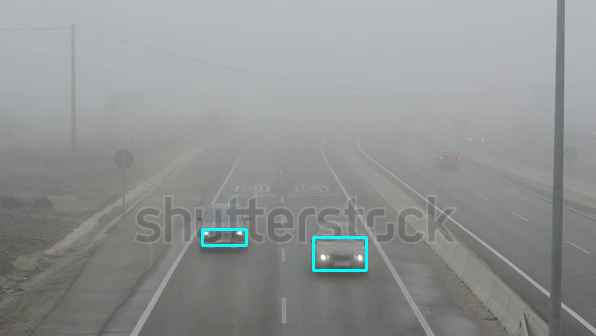

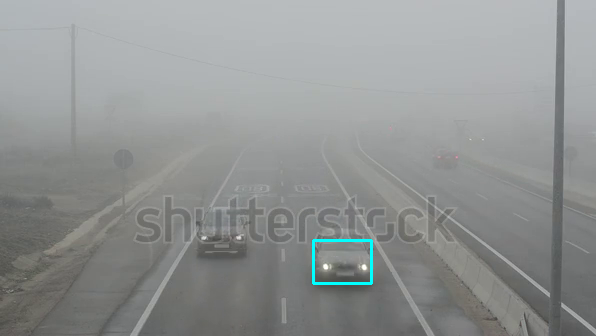

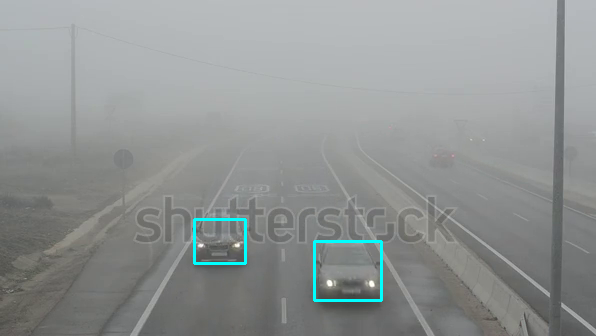

Frame limit reached. Breaking loop.

✅ Saved 100 frames to 'output.gif'
⏱️ Total time: 913.41 sec
⚡ Avg FPS: 0.11


In [ ]:
# import libraries
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import time
import imageio
import torch
import torchvision.transforms as T
from torchvision import models

# --- SETTINGS ---
video_path = r"/content/fog vehicle detection.mp4"
output_path = "output.gif"
min_contour_area = 150
frame_limit = 100
frame_skip = 3     # Skip every 3rd frame for less redundancy

# --- Load DeepLabV3 model ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
deep_model = models.segmentation.deeplabv3_resnet101(pretrained=True).to(device)
deep_model.eval()
transform = T.Compose([
    T.ToPILImage(),
    T.Resize((360, 640)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# --- Background Subtractors ---
KNN_subtractor = cv2.createBackgroundSubtractorKNN(detectShadows=True)
MOG2_subtractor = cv2.createBackgroundSubtractorMOG2(detectShadows=True, history=500, varThreshold=100)
bg_subtractor = MOG2_subtractor

# --- Video Setup ---
video = cv2.VideoCapture(video_path)
if not video.isOpened():
    print("Error: Cannot open video.")
    exit()

frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(video.get(cv2.CAP_PROP_FPS))
total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
print('total frames:', total_frames)

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
writer = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

frame_list = []
frame_count = 0
processed_count = 0
start_time = time.time()

while True:
    ret, frame = video.read()
    if not ret:
        print("Error: Could not read frame. Breaking loop.")
        break

    if frame_count % frame_skip != 0:
        frame_count += 1
        continue

    # --- CLAHE Contrast Enhancement ---
    lab = cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    enhanced_frame = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

    # --- Apply Semantic Segmentation ---
    with torch.no_grad():
        input_tensor = transform(enhanced_frame).unsqueeze(0).to(device)
        output = deep_model(input_tensor)['out'][0]
        seg_mask = output.argmax(0).byte().cpu().numpy()

    # Only keep vehicles (DeepLabv3 class 2 = car, 5 = bus, 7 = truck)
    vehicle_mask = np.isin(seg_mask, [2, 5, 7]).astype(np.uint8) * 255

    # --- Background Subtraction ---
    foreground_mask = bg_subtractor.apply(enhanced_frame)
    ret, threshold = cv2.threshold(foreground_mask.copy(), 120, 255, cv2.THRESH_BINARY)
    dilated = cv2.dilate(threshold, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3)), iterations=1)

    # --- Combine with semantic mask ---
    vehicle_mask_resized = cv2.resize(vehicle_mask, (dilated.shape[1], dilated.shape[0]))
    filtered_mask = cv2.bitwise_and(dilated, vehicle_mask_resized)

    contours, _ = cv2.findContours(filtered_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for contour in contours:
        if cv2.contourArea(contour) > min_contour_area:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 255, 0), 2)

    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame_list.append(frame_rgb)
    cv2_imshow(frame)

    if cv2.waitKey(30) & 0xFF == ord('q'):
        print("User stopped the process.")
        break

    processed_count += 1
    if processed_count >= frame_limit:
        print("Frame limit reached. Breaking loop.")
        break

    frame_count += 1

# --- Cleanup ---
video.release()
writer.release()
cv2.destroyAllWindows()
imageio.mimsave(output_path, frame_list, fps=10)

end_time = time.time()
print(f"\n✅ Saved {processed_count} frames to '{output_path}'")
print(f"⏱️ Total time: {end_time - start_time:.2f} sec")
print(f"⚡ Avg FPS: {processed_count / (end_time - start_time):.2f}")